In [ ]:
import json
import os

import contextily as ctx
import cv2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [4]:
%matplotlib widget

In [ ]:
inference_export = "../model/runs/cassda-wildlife-crossing/yolo11-CH-conf0_35/detection_results_filtered_road_intersect.csv"
image_dir = "E:/cassda-data/street-tiles/CH/images"

In [8]:
df_filtered = pd.read_csv(f"{inference_export}", header=0)
detections = df_filtered.to_dict(orient="records")

gdf_filtered = gpd.GeoDataFrame(
    df_filtered,
    geometry=gpd.points_from_xy(df_filtered.xc_epsg3035, df_filtered.yc_epsg3035),
    crs="EPSG:3035",
)

In [ ]:
def plot_detection_subset(detections_subset, nrows, ncols):
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 30))
    axs = axs.flatten()

    for r, ax in zip(detections_subset, axs):
        img = cv2.imread(os.path.join(image_dir, r.get("image_path")))
        ax.imshow(img)
        ax.set_title(os.path.basename(r.get("image_path")), fontsize=10)

        polygon = json.loads(r.get("obb_xyxyxyxy"))

        cx, cy, w, h = r.get("obb_x"), r.get("obb_y"), r.get("obb_w"), r.get("obb_h")
        poly = plt.Polygon(
            np.array(polygon).reshape(-1, 2),
            fill=False,
            edgecolor="red",
            linewidth=0.5,
        )
        ax.add_patch(poly)

        # add confidence to the polygon
        conf = r.get("confidence")
        ax.text(
            cx + w / 2,
            cy - h / 2,
            f"{conf:.2f}",
            fontsize=12,
            color="red",
            ha="center",
            va="bottom",
        )
        # ax.axis("off")
    plt.tight_layout()
    plt.show()

In [ ]:
# create plot with 3 columns and 10 rows, repeat until all images are plotted
ncols = 3
nrows = 5
imgs_per_plot = ncols * nrows
num_plots = (len(detections) + imgs_per_plot - 1) // imgs_per_plot


def get_idx(plot_id, num_images, imgs_per_plot):
    start_idx = plot_id * imgs_per_plot
    end_idx = min(start_idx + imgs_per_plot, num_images)
    return start_idx, end_idx

Plotting images 0 to 15 out of 41


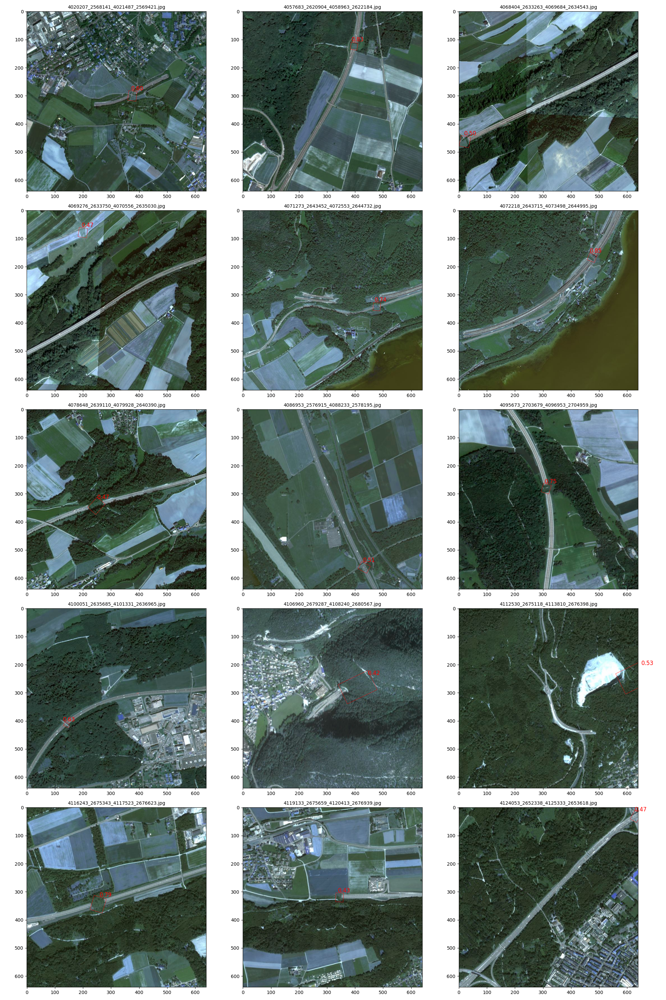

In [ ]:
plot_id = 0  # Change this value to view different subsets
start_idx, end_idx = get_idx(plot_id, len(detections), imgs_per_plot)
detections_subset = detections[start_idx:end_idx]

print(f"Plotting images {start_idx} to {end_idx} out of {len(detections)}")
plot_detection_subset(detections_subset, nrows, ncols)